In [223]:
# exercise 1

# classification functions
import numpy as np

def alr(X, y):
    return np.linalg.inv(X.T @ X) @ X.T @ y

def classify(X, y):
    new_y = y.copy()
    classifier = alr(X, y)
    for i in range(0, len(y)):
        new_y[i] = 0 if classifier[0] * y[i] + classifier[1] > X[i][1] else 1
    return new_y


In [224]:
# make classification (i added class_sep parameter, beacause without it sample were not separated at all, the results are much clearer, which makes classification more reliable right now) 

from sklearn.datasets import make_classification
from sklearn.metrics import accuracy_score

X, y = make_classification(n_samples = 1000, n_features=2, n_classes=2, n_informative=2, n_redundant=0, n_repeated=0, n_clusters_per_class=1,random_state=239523, class_sep=4.0)

X_close, y_close = make_classification(n_samples = 1000, n_features=2, n_classes=2, n_informative=2, n_redundant=0, n_repeated=0, n_clusters_per_class=1,random_state=239523, class_sep=1.0)

result = classify(X, y)
result_close = classify(X_close, y_close)

print("accuracy for separated classes: ", accuracy_score(y, result))
print("accuracy for not separated classes: ", accuracy_score(y_close, result_close))

accuracy for separated classes:  0.995
accuracy for not separated classes:  0.835


Text(0.5, 1.0, 'not separated classes')

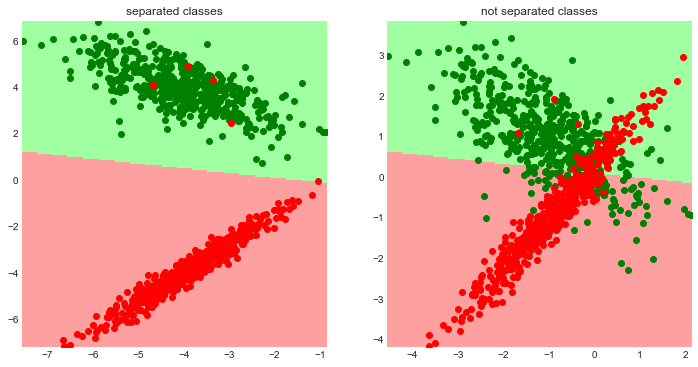

In [225]:
# visualize data
import matplotlib.pyplot as plt
import matplotlib as mpl

plt.style.use('seaborn-darkgrid')
plt.show()

# prepare data needed for first plot
n = 200
x_max, x_min = X[:, 0].max(), X[:, 0].min()
y_max, y_min = X[:, 1].max(), X[:, 1].min()

xx, yy = np.meshgrid(np.linspace(x_min, x_max, n),
                     np.linspace(y_min, y_max, n),
                     sparse=True)

Z = np.zeros((n, n))
classifier = alr(X, y)
classifier_close = alr(X_close, y_close)

for i in range(0, n):
    for j in range(0, n):
        Z[j, i] = 1 if classifier[0] * xx.T[i] + classifier[1] > yy[j] else 0

cm_light = mpl.colors.ListedColormap(['#A0FFA0', '#FFA0A0'])

a = X[y == 1]
b = X[y == 0]

fig, axs = plt.subplots(1, 2 ,figsize=(12, 6))
axs[0].pcolormesh(xx, yy, Z, cmap=cm_light, shading='auto')
axs[0].scatter(a.T[0], a.T[1], color='green')
axs[0].scatter(b.T[0], b.T[1], color='red')
axs[0].set_title('separated classes')

# repeat everything for second plot
x_max, x_min = X_close[:, 0].max(), X_close[:, 0].min()
y_max, y_min = X_close[:, 1].max(), X_close[:, 1].min()
xx, yy = np.meshgrid(np.linspace(x_min, x_max, n),
                     np.linspace(y_min, y_max, n),
                     sparse=True)

a = X_close[y == 1]
b = X_close[y == 0]

for i in range(0, n):
    for j in range(0, n):
        Z[j, i] = 1 if classifier[0] * xx.T[i] + classifier[1] > yy[j] else 0

axs[1].pcolormesh(xx, yy, Z, cmap=cm_light, shading='auto')
axs[1].scatter(a.T[0], a.T[1], color='green')
axs[1].scatter(b.T[0], b.T[1], color='red')
axs[1].set_title('not separated classes')

# wyniki

Jak można było się spodziewać klasyfikacja liniowa zadziała wystarczjąco dobrze w przyapdku kiedy cechy klas znacznie różnią się od siebie, nie da się co prawda wychwycić próbke skrajnych (tj. np. czerwonych kropek w zielonej klasie), niemniej skutecnzość jest na poziomie ponad 99%, problemy są nieco większe. w przypadku klas mniej różniących się od siebie, tutaj dobranie prostej, jak widać zresztą na wykresie jest trudne i mniej skuteczne (83%)


In [226]:
# exercise 2

# load data
import pandas as pd

colnames = ['age', 'sex', 'cp', 'trestbps', 'chol', 'fbs', 'restecg', 'thalach', 'exang', 'oldpeak', 'slope', 'ca', 'thal', 'num']
data =  pd.read_csv('./processed.cleveland.data', sep=',', names=colnames, header=None)


In [227]:
# count missing values

data = data.replace("?", np.nan)
print("missing entries: ")
display(data.isna().sum(axis=0))

missing entries: 


age         0
sex         0
cp          0
trestbps    0
chol        0
fbs         0
restecg     0
thalach     0
exang       0
oldpeak     0
slope       0
ca          4
thal        2
num         0
dtype: int64

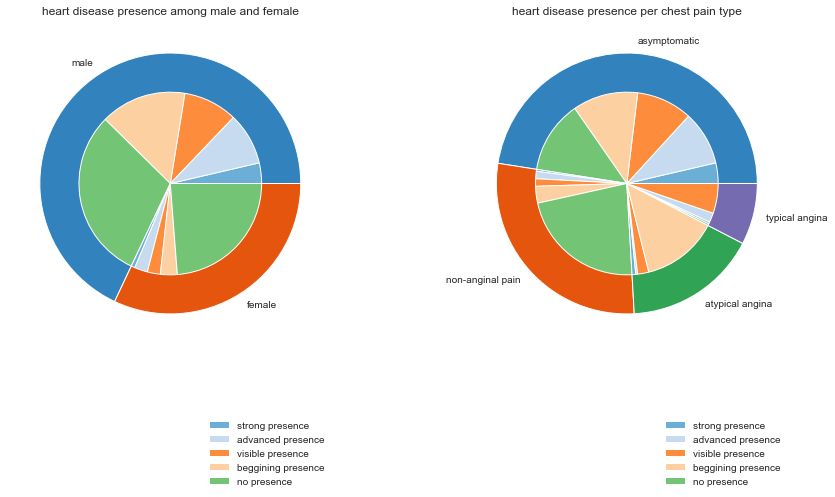

In [228]:
# plot binary and categorical variables
fig, (ax1, ax2) = plt.subplots(1, 2, figsize=(15, 6))
# Setting figure colors
cmap = plt.get_cmap("tab20c")
outer_colors = cmap(np.arange(2)*4)
inner_colors = cmap([1, 3, 5, 7, 9])

sex = data['sex'].value_counts()
diseases_per_sex = data.groupby('num')['sex'].value_counts(ascending=True)

labels = ['male', 'female']
ax1.pie(sex, labels = labels,
    colors=outer_colors,
    radius= 1.0,
    wedgeprops = {'linewidth' : 1, 'edgecolor' : "w" } )

# i came up with these, it's not exatc meaning of these numbers
sublabels = ['strong presence', 'advanced presence', 'visible presence', 'beggining presence', 'no presence']

patches, texts = ax1.pie(diseases_per_sex.sort_index(level=1, ascending=False).to_numpy(),
    colors=inner_colors,
    radius= 0.70,
    wedgeprops = {'linewidth' : 1, 'edgecolor' : "w" } )

ax1.legend(patches, sublabels, bbox_to_anchor=(0., -0.1, 1., -0.1), loc=1)
ax1.set_title("heart disease presence among male and female")

cp = data['cp'].value_counts()
diseases_per_cp = data.groupby('num')['cp'].value_counts()
labels = ['asymptomatic', 'non-anginal pain', 'atypical angina', 'typical angina']

outer_colors = cmap(np.arange(4)*4)
inner_colors = cmap([1, 3, 5, 7, 9])
ax2.pie(cp, labels = labels,
    colors=outer_colors,
    radius= 1.0,
    wedgeprops = {'linewidth' : 1, 'edgecolor' : "w" } )

patches, texts = ax2.pie(diseases_per_cp.sort_index(level=1, ascending=False).to_numpy(),
    colors=inner_colors,
    radius= 0.70,
    wedgeprops = {'linewidth' : 1, 'edgecolor' : "w" } )

ax2.legend(patches, sublabels, bbox_to_anchor=(0., -0.1, 1., -0.1), loc=1)
ax2.set_title("heart disease presence per chest pain type")

plt.show()

# wnioski 

Na przedstawionych wykresach widac mniędzy innymi, że większość chorób serca jest diagnozowana u mężczyzn oraz, że nie dławicowy (non-anginal z google translate) ból w kaltce piersiowej prawdopodobnie nie świadczy o potencjalnej chorobie serca

W przypadku nietypowej dławicy piersiowej (atypical angina), należałoby się martwić, poniewac dane sugerują, że jest ona niemal gwarantem choroby serca.

Nie rysowałem wukresów kazdej zmiennej bo nie starczyło mi czasu

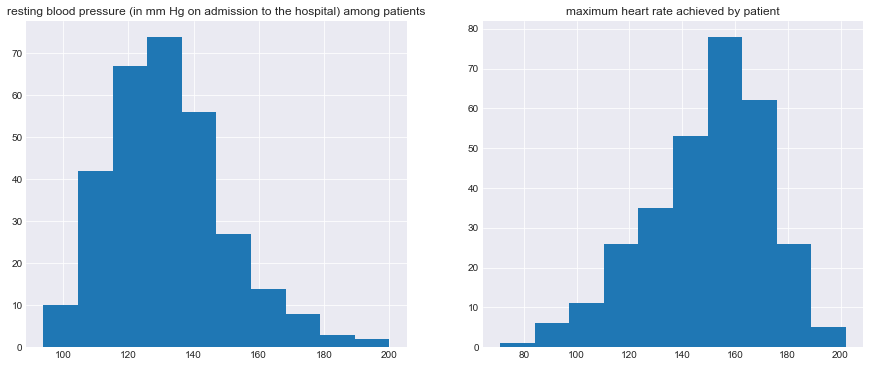

In [229]:
# plot histograms for continuous variables
fig, (ax1, ax2) = plt.subplots(1, 2, figsize=(15, 6))

ax1.hist(data['trestbps'])
ax1.set_title('resting blood pressure (in mm Hg on admission to the hospital) among patients')

ax2.hist(data['thalach'])
ax2.set_title('maximum heart rate achieved by patient')

plt.show()

# wnioski

histogram pierwszy sugeruje, iż w przypadku większoći pacjentów ciśnienie tętnicze nie odbiegało od normy, (nie jestem lekarzem, ale 120-150 to chyba normalna wartość), podobnie w przypadku maksymalnego pulsu, ten rzadko był na poziomie powyżej 160 (ponownie - nie jestem lekarzem, więc nie wyciągnę medycznych wniosków)

Oba histogramy mają skośne rozkłady (right-skewed, left-skewed), wynika to z naturalnych limitów organizmu ludzkiego

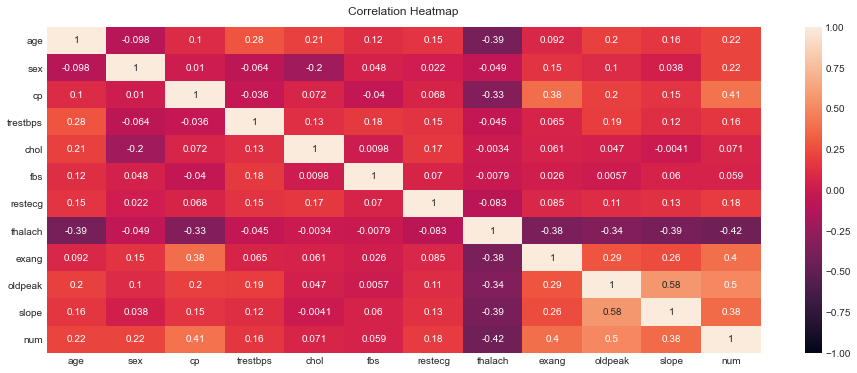

In [230]:
# corelation matrix
import seaborn as sns

plt.figure(figsize=(16, 6))
heatmap = sns.heatmap(data.corr(), vmin=-1, vmax=1, annot=True)
heatmap.set_title('Correlation Heatmap', fontdict={'fontsize':12}, pad=12)

plt.show()


# wnioski

na podstawie macierzy można wyciągnąć wniosek, że najbardziej skorelowane z potencjalną chorobą serca są zmienne 'chest pain type' oraz 'ST depression induced by exercise relative to rest', mogą one mieć duże znaczenie przy towrzeniu modeli i potencjalnym wykrywaniu chorób serca

In [231]:
# present basic statistics for data
filtered_out = data.astype('float64').dropna()
# numerical data
display(filtered_out[['age', 'trestbps', 'chol', 'thalach', 'oldpeak']].describe())
# categorical data
display(filtered_out[['sex', 'cp', 'fbs', 'restecg', 'exang', 'slope', 'ca', 'thal', 'num']].astype('category').describe())


,age,trestbps,chol,thalach,oldpeak
count,297.000000,297.000000,297.000000,297.000000,297.000000
mean,54.542088,131.693603,247.350168,149.599327,1.055556
std,9.049736,17.762806,51.997583,22.941562,1.166123
min,29.000000,94.000000,126.000000,71.000000,0.000000
25%,48.000000,120.000000,211.000000,133.000000,0.000000
50%,56.000000,130.000000,243.000000,153.000000,0.800000
75%,61.000000,140.000000,276.000000,166.000000,1.600000
max,77.000000,200.000000,564.000000,202.000000,6.200000


,sex,cp,fbs,restecg,exang,slope,ca,thal,num
count,297.0,297.0,297.0,297.0,297.0,297.0,297.0,297.0,297.0
unique,2.0,4.0,2.0,3.0,2.0,3.0,4.0,3.0,5.0
top,1.0,4.0,0.0,0.0,0.0,1.0,0.0,3.0,0.0
freq,201.0,142.0,254.0,147.0,200.0,139.0,174.0,164.0,160.0


# wnioski

jak już wspomniałem wcześniej, najbardziej skorelowane z chorobą układu serca są 'chest pain type' oraz 'ST depression induced by exercise relative to rest', to w nich dopatrywałbym się najlepszych kandydatów do klasyfikacji